In [1]:
import numpy as np
import cv2
import os
import pandas as pd
from collections import Counter as cnt
import matplotlib.pyplot as plt
import torch
import csv
import sys
from scipy.stats import chi2_contingency
import pickle
from scipy import stats

#import modulefmat
sys.path.append('/home/bis/230711_JSG/230602_JSG_Image/')
from Mymodule.ModelHandler import *
from Mymodule.Utils import *
from Mymodule.GradCam import *
from Mymodule.BatchHandler import *
from collections import Counter as cnt
from torchvision import transforms
from keras import Sequential
from torch import nn

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, roc_curve, accuracy_score, confusion_matrix
from torch import optim

import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

from tqdm import tqdm
from PIL import Image, ImageEnhance
import torch.nn.functional as F

2024-11-19 12:30:53.239748: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-19 12:30:53.293407: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-19 12:30:54.037259: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## Prepare Dataset

In [2]:
image_roots = {}
image_roots['train'] = f'./Images/Train/'
image_roots['val'] = f'./Images/Validation/'
image_roots['test'] = f'./Images/Test/' 

train_images = os.listdir(image_roots['train'])
val_images = os.listdir(image_roots['val'])
test_images  = os.listdir(image_roots['test'])                        
print(len(train_images), len(val_images), len(test_images) )
train_images[0]

381 128 128


'10601785 84 1.png'

# Test Plot

In [3]:
train_image_path1 = './Images/Train/10867708 60 1.png'
print(plt.imread(train_image_path1).shape)
#plt.figure(figsize = (7,7))
#plt.imshow(plt.imread(train_image_path1))

(381, 375, 4)


In [4]:
import os
import pickle
import cv2
import numpy as np
from tqdm import tqdm

complete_data_path = "./Data/feature_for_voting.pkl"
output_root = "./Data/cropped_images"  # Root directory to save cropped images

# For making dataset...
stages = ['train', 'val', 'test']
categories = ['image', 'pt_no', 'age', 'label']
crops = [3, 4, 6]

#if os.path.exists(complete_data_path):
if 1==0 :
    print('Data already exists')
    with open(complete_data_path, 'rb') as fr:
        data = pickle.load(fr)

else:
    data = {}
    for crop in crops:
        data[crop] = {}
        for stage in stages:
            data[crop][stage] = {}
            for category in categories:
                data[crop][stage][category] = []

            image_root = image_roots[stage]
            stage_output_dir = os.path.join(output_root, f"crop_{crop}", stage)

            # Create directories if they do not exist
            os.makedirs(stage_output_dir, exist_ok=True)

            for image in tqdm(os.listdir(image_root)):
                if not image.endswith('png'):
                    continue

                pt_no, age, label = image.split(' ')
                label = label.split('.')[0]
                pt_no, age, label = pt_no, int(age), int(label)

                # Convert labels
                if label in [0, 1]:
                    label = 0
                elif label in [2, 3]:
                    label = 1

                image_path = os.path.join(image_root, image)
                whole_image = cv2.imread(image_path)
                height, width, _ = whole_image.shape

                # Processing each crop level
                if crop == 3:
                    crop_height = height // 3
                    for i in range(3):
                        start_row, end_row = i * crop_height, (i + 1) * crop_height
                        cropped_image = whole_image[start_row:end_row, :]
                        cropped_image = cv2.resize(cropped_image, (140, 140))

                        # Save cropped image
                        cropped_filename = f"{pt_no}_{age}_{label}_part_{i+1}.png"
                        cv2.imwrite(os.path.join(stage_output_dir, cropped_filename), cropped_image)

                        # Append data
                        data[crop][stage]['image'].append(cropped_image)
                        data[crop][stage]['pt_no'].append(pt_no)
                        data[crop][stage]['age'].append(age)
                        data[crop][stage]['label'].append(label)

                elif crop == 4:
                    crop_height = height // 2
                    crop_width = width // 2
                    for i in range(2):
                        for j in range(2):
                            start_row, end_row = i * crop_height, (i + 1) * crop_height
                            start_col, end_col = j * crop_width, (j + 1) * crop_width
                            cropped_image = whole_image[start_row:end_row, start_col:end_col]
                            cropped_image = cv2.resize(cropped_image, (140, 140))

                            # Save cropped image
                            cropped_filename = f"{pt_no}_{age}_{label}_part_{i*2+j+1}.png"
                            cv2.imwrite(os.path.join(stage_output_dir, cropped_filename), cropped_image)

                            # Append data
                            data[crop][stage]['image'].append(cropped_image)
                            data[crop][stage]['pt_no'].append(pt_no)
                            data[crop][stage]['age'].append(age)
                            data[crop][stage]['label'].append(label)

                elif crop == 6:
                    crop_height = height // 3
                    crop_width = width // 2
                    for i in range(3):
                        for j in range(2):
                            start_row, end_row = i * crop_height, (i + 1) * crop_height
                            start_col, end_col = j * crop_width, (j + 1) * crop_width
                            cropped_image = whole_image[start_row:end_row, start_col:end_col]
                            cropped_image = cv2.resize(cropped_image, (140, 140))

                            # Save cropped image
                            cropped_filename = f"{pt_no}_{age}_{label}_part_{i*2+j+1}.png"
                            cv2.imwrite(os.path.join(stage_output_dir, cropped_filename), cropped_image)

                            # Append data
                            data[crop][stage]['image'].append(cropped_image)
                            data[crop][stage]['pt_no'].append(pt_no)
                            data[crop][stage]['age'].append(age)
                            data[crop][stage]['label'].append(label)

            # Convert data to numpy arrays
            data[crop][stage]['image'], data[crop][stage]['age'], data[crop][stage]['label'] = (
                np.array(data[crop][stage]['image']),
                np.array(data[crop][stage]['age']),
                np.array(data[crop][stage]['label']))

    # Save data
    with open(complete_data_path, 'wb') as fw:
        pickle.dump(data, fw)

print(data.keys())


100%|██████████| 128/128 [00:01<00:00, 103.28it/s]


dict_keys([3, 4, 6])


### Model preparation

In [5]:
device = torch.device('cuda:2')

epochs = 20
milestone = [epochs-10, epochs-6]
min_epoch = 5
batch = 64
lr = 1e-4

model_name = 'vgg16'

### Training

In [6]:
#for transformation
#... clinic - learning_strategy - mri - group
#... first... without clinic.... to make model...
train_strategies = ['finetuning']

for crop in crops:
    for model_name in ['vgg16','resnet50', 'vgg19', 'resnet152']:#, 'inception']:
        for train_strategy in train_strategies:
            model_save_path = f'./Model/voting{crop}_{model_name}_{train_strategy}.pt'

            if not os.path.isfile(model_save_path):
            #if 1 == 1 :
                train_x, val_x, test_x = data[crop]['train']['image'], data[crop]['val']['image'], data[crop]['test']['image']
                train_y, val_y, test_y  = data[crop]['train']['label'][:,None], data[crop]['val']['label'][:,None], data[crop]['test']['label'][:,None]

                #only use randrot, randvert, randaff...
                randrot, randvert, randaff, sharpness, brightness = [-15,15], 0.15, [0.1, 1], 2.0, 3.0

                train_transform = [
                    transforms.RandomRotation(randrot),
                    transforms.RandomVerticalFlip(p=randvert),
                    transforms.RandomAffine(0, translate=randaff),
                    #transforms.RandomAdjustSharpness(sharpness_factor=sharpness, p=1.0),  # 선명도 조정 확률을 1로 설정
                    #transforms.ColorJitter(brightness=brightness),  # 밝기 조정
                ]

                train_loader = GetLoader(train_transform, train_x, train_y, batch=batch, test=False)
                val_loader = GetLoader([], val_x, val_y, batch=len(val_y), test=True)
                test_loader = GetLoader([], test_x, test_y, batch=len(test_y), test=True)      

                if train_strategy == 'finetuning'  : model = get_model(model_name, device, pretrained=True, freeze = False)
                if train_strategy == 'fromscratch' : model = get_model(model_name, device, pretrained=False, freeze = False)
                if train_strategy == 'freeze'      : model = get_model(model_name, device, pretrained=False, freeze = True)
                optimizer = optim.Adam(model.parameters(), lr=lr)
                scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestone)

                history_t_loss, history_loss, history_auc, history_test_auc, history_train_auc = \
                train_convnet(model, device, train_loader, val_loader, test_loader, lr, epochs, model_save_path,
                optimizer=optimizer, scheduler=scheduler, min_epoch=min_epoch, pos_weight=0, save_by='val_auc', out = True)

                bestepoch = np.argmax(history_auc[min_epoch-1:]) + min_epoch
                print("best epoch : ", bestepoch, " train auc : ",format(history_train_auc[bestepoch-1],".4f"),  " valid auc : ", format(history_auc[bestepoch-1],".4f"), "test auc : ", format(history_test_auc[bestepoch-1],".4f"))

        else : print(f'{model_name}_{train_strategy} already exists')

vgg16_finetuning already exists
resnet50_finetuning already exists
vgg19_finetuning already exists
resnet152_finetuning already exists
vgg16_finetuning already exists
resnet50_finetuning already exists
vgg19_finetuning already exists
resnet152_finetuning already exists
vgg16_finetuning already exists
resnet50_finetuning already exists
vgg19_finetuning already exists
resnet152_finetuning already exists


### Getting Probability from VGG16 & Resnet50 Model

In [7]:
output_path = './Data/voting_output.pkl'
sig = torch.nn.Sigmoid()

#if not os.path.isfile(output_path):
if 1 == 1 :
    output = {}
    
    for crop in crops:
        output[crop] = {}
        for model_name in ['vgg16','resnet50', 'vgg19', 'resnet152', 'Ensemble']:
            print(model_name)
            output[crop][model_name] = {}
            for train_strategy in train_strategies:
                output[crop][model_name][train_strategy] = {}
                print(f'train_strategy_{train_strategy}')
                if not model_name == 'Ensemble' :
                    model_save_path = f'./Model/voting{crop}_{model_name}_{train_strategy}.pt'

                    model = get_model(model_name, device, pretrained=True)    
                    model.load_state_dict(torch.load(model_save_path))
                    model.eval()

                    train_x,      val_x,      test_x      = data[crop]['train']['image'] , data[crop]['val']['image'] , data[crop]['test']['image']
                    train_y,      val_y,      test_y      = data[crop]['train']['label'] , data[crop]['val']['label'] , data[crop]['test']['label']

                    randrot, randvert, randaff = [-15,15], 0.15, [0.1, 1]
                    train_transform = [transforms.RandomRotation(randrot), transforms.RandomVerticalFlip(p=randvert), transforms.RandomAffine(0, translate=randaff)]

                    train_loader = GetLoader(train_transform, train_x, train_y, batch=batch, test=True)
                    val_loader = GetLoader([], val_x, val_y, batch=len(val_y), test=True)
                    test_loader = GetLoader([], test_x, test_y, batch=len(test_y), test=True)      

                # for getting probabilities from trained vgg16 models.
                with torch.no_grad():
                    for stage in stages:
                        output[crop][model_name][train_strategy][stage] = {}
                        if not model_name == 'Ensemble':
                            if stage == 'train' : loader = train_loader
                            if stage == 'val'   : loader = val_loader
                            if stage == 'test'  : loader = test_loader
                            check = 0
                            for image, label in loader:
                                image, label = image.to(device), label.to(device)
                                logit = model(image)
                                proba, label = sig(logit), label.float()
                                if check ==0: probas, logits, labels = proba, logit,label
                                if check ==1: probas, logits, labels = torch.cat([probas, proba]), torch.cat([logits, logit]), torch.cat([labels, label])
                                check = 1
                            output[crop][model_name][train_strategy][stage]['proba'], output[crop][model_name][train_strategy][stage]['logit'], output[crop][model_name][train_strategy][stage]['label'] = probas.cpu().numpy(), logits.cpu().numpy(), labels.cpu().numpy()                
                            output[crop][model_name][train_strategy][stage]['age'] = data[crop][stage]['age']
                        if model_name == 'Ensemble':
                            vgg16_proba, vgg16_logit, vgg16_label = output[crop]['vgg16'][train_strategy][stage]['proba'], output[crop]['vgg16'][train_strategy][stage]['logit'], output[crop]['vgg16'][train_strategy][stage]['label']
                            vgg19_proba, vgg19_logit, vgg19_label = output[crop]['vgg19'][train_strategy][stage]['proba'], output[crop]['vgg19'][train_strategy][stage]['logit'], output[crop]['vgg19'][train_strategy][stage]['label']
                            ensemble_proba, ensemble_logit, ensemble_label = (vgg16_proba + vgg19_proba)/2, (vgg16_logit + vgg19_logit)/2, (vgg16_label + vgg19_label)/2
                            output[crop]['Ensemble'][train_strategy][stage]['proba'], output[crop]['Ensemble'][train_strategy][stage]['logit'], output[crop]['Ensemble'][train_strategy][stage]['label'] = ensemble_proba, ensemble_logit, ensemble_label
                            output[crop]['Ensemble'][train_strategy][stage]['age'] = data[crop][stage]['age']

    #save data
    with open(output_path,'wb') as fw:
        pickle.dump(output, fw)

elif os.path.isfile(output_path):
    with open(output_path, 'rb') as fr:
        output= pickle.load(fr)
        
output.keys()

vgg16
train_strategy_finetuning


/home/bis/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/bis/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


resnet50
train_strategy_finetuning


/home/bis/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


vgg19
train_strategy_finetuning


/home/bis/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


resnet152
train_strategy_finetuning


/home/bis/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Ensemble
train_strategy_finetuning
vgg16
train_strategy_finetuning
resnet50
train_strategy_finetuning
vgg19
train_strategy_finetuning
resnet152
train_strategy_finetuning
Ensemble
train_strategy_finetuning
vgg16
train_strategy_finetuning
resnet50
train_strategy_finetuning
vgg19
train_strategy_finetuning
resnet152
train_strategy_finetuning
Ensemble
train_strategy_finetuning


dict_keys([3, 4, 6])

### Assessment with figures

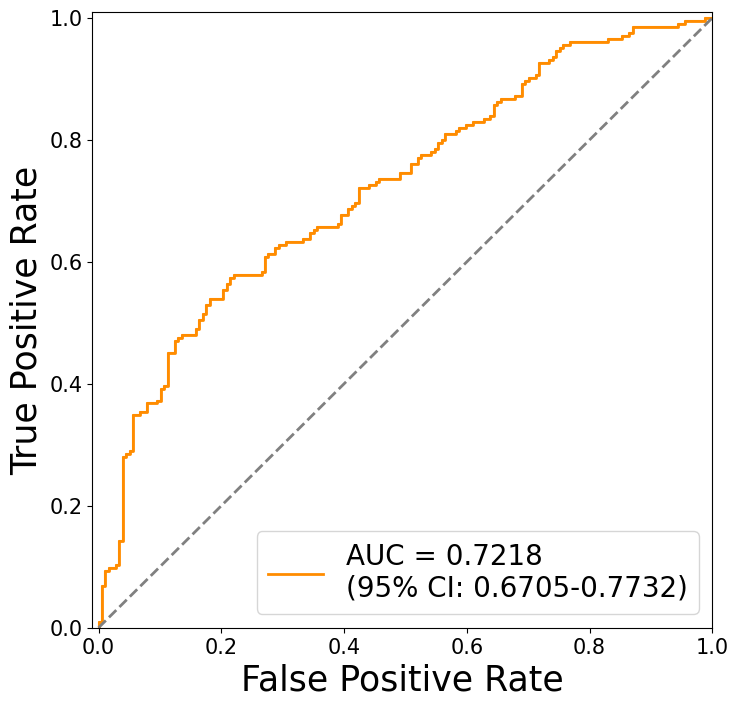

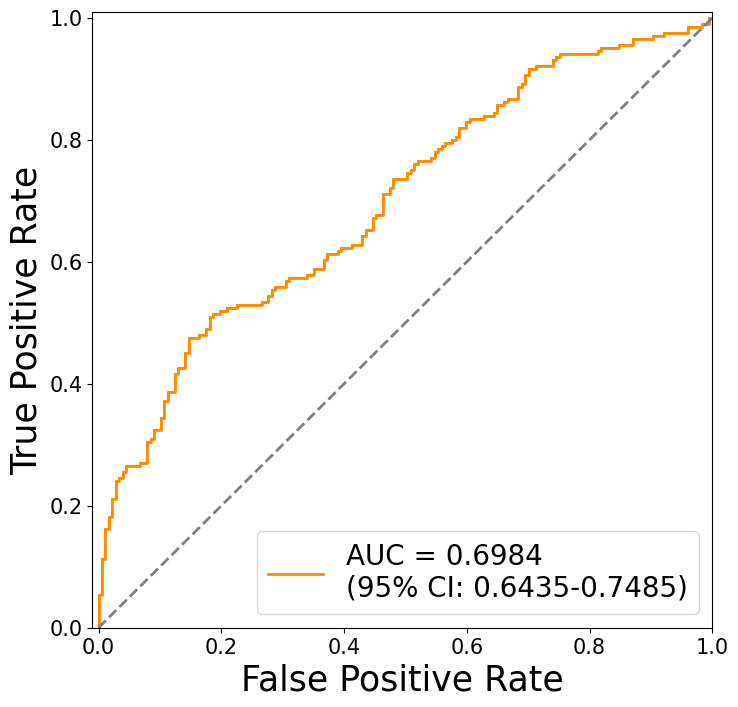

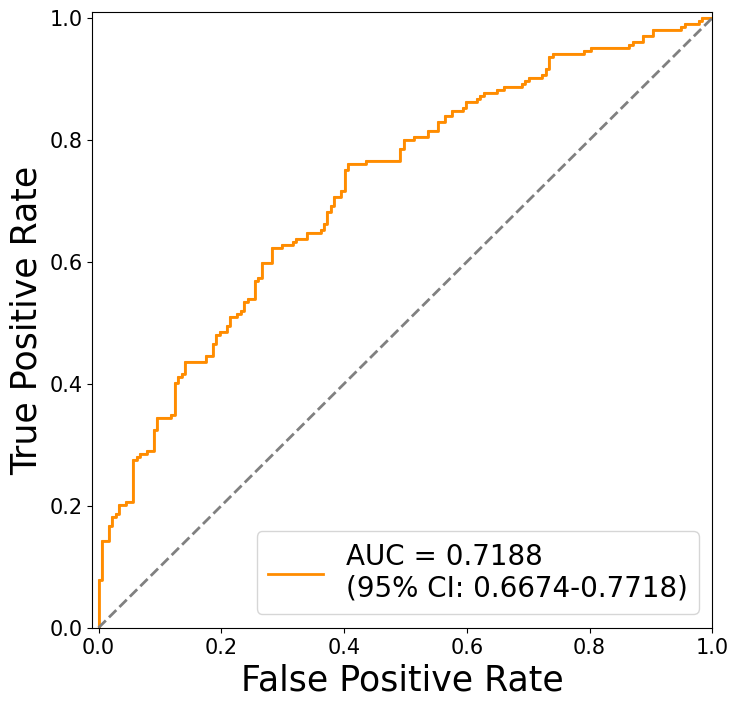

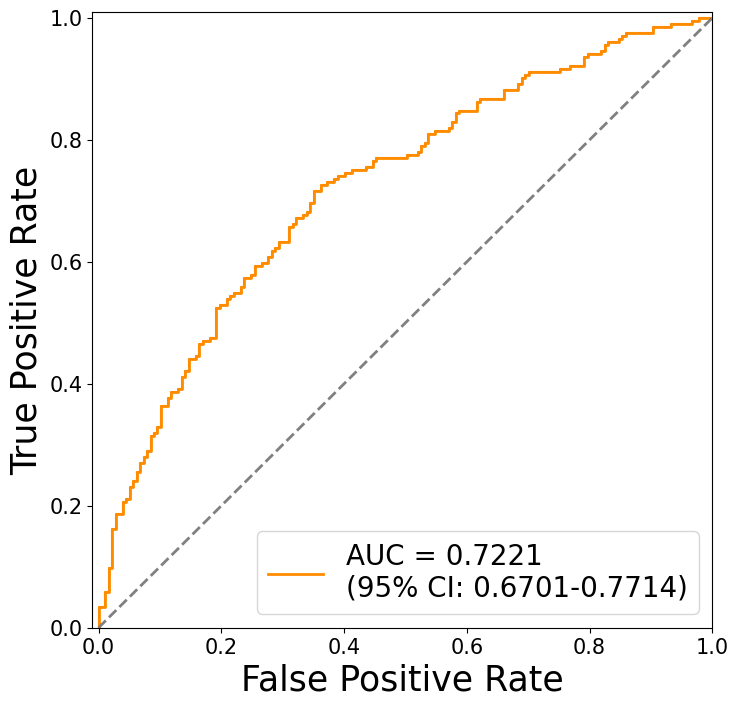

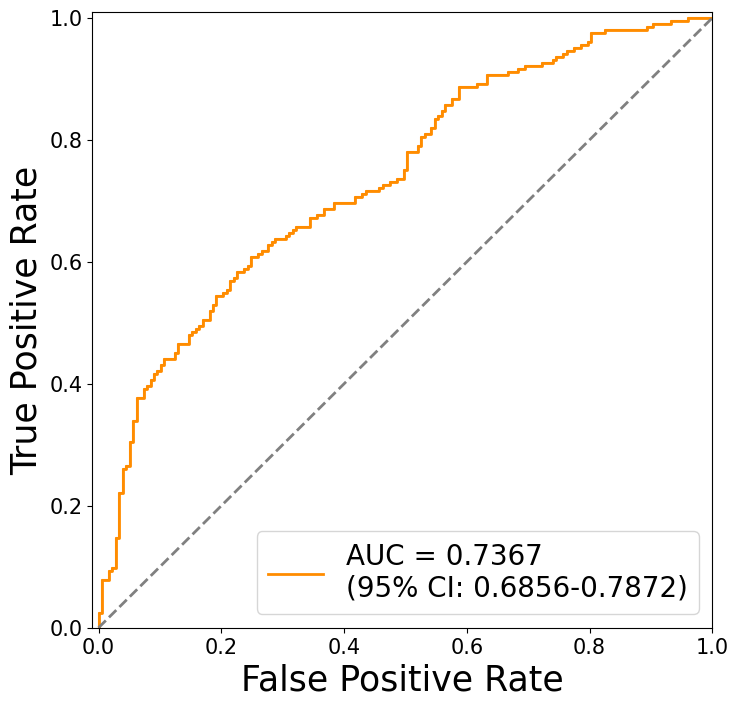

...

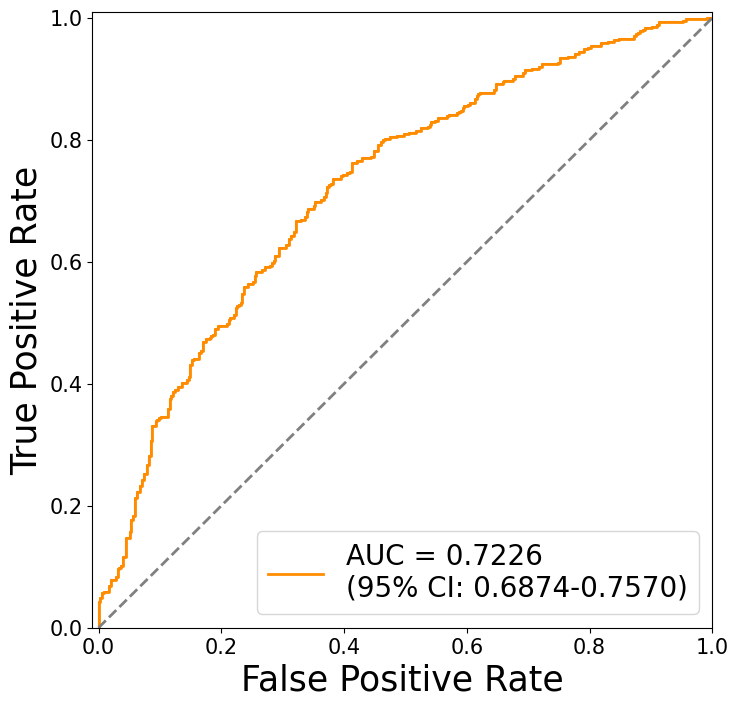

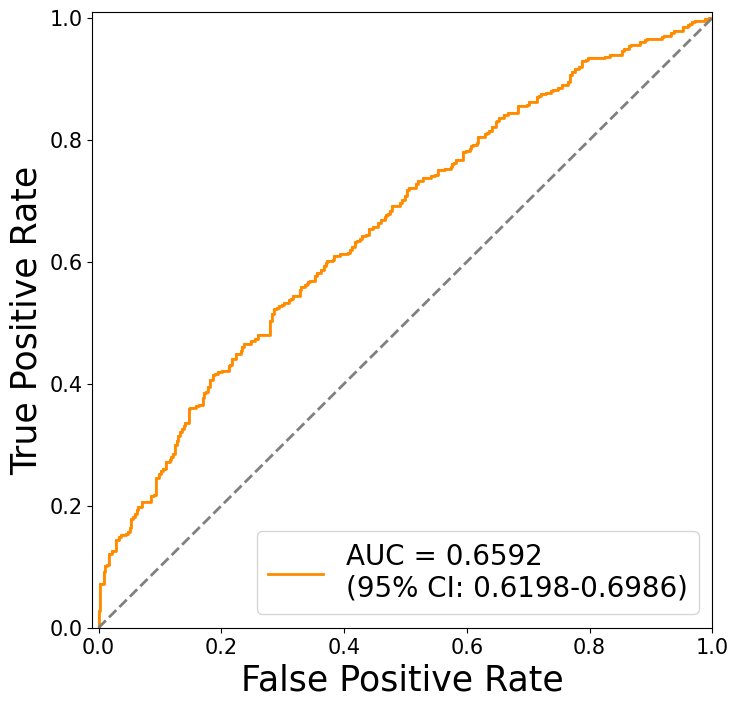

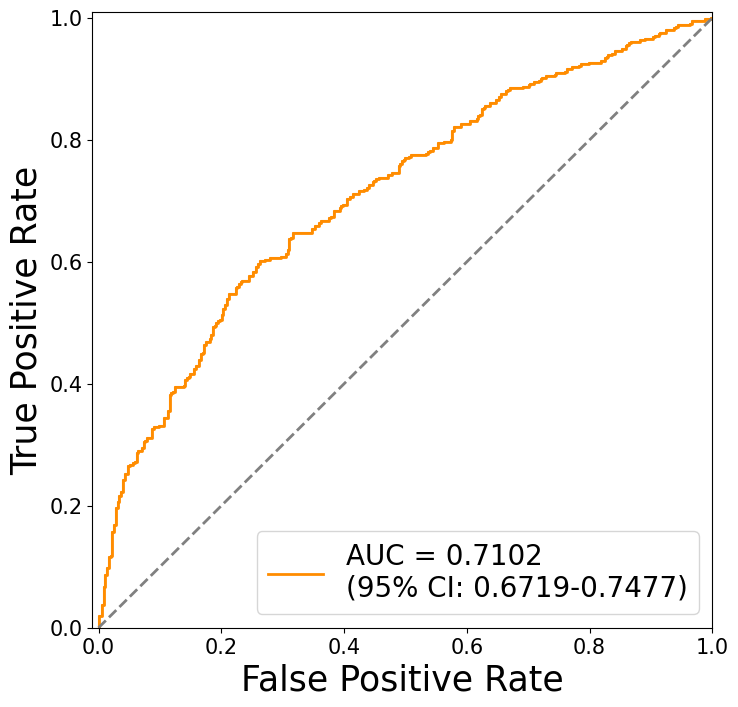

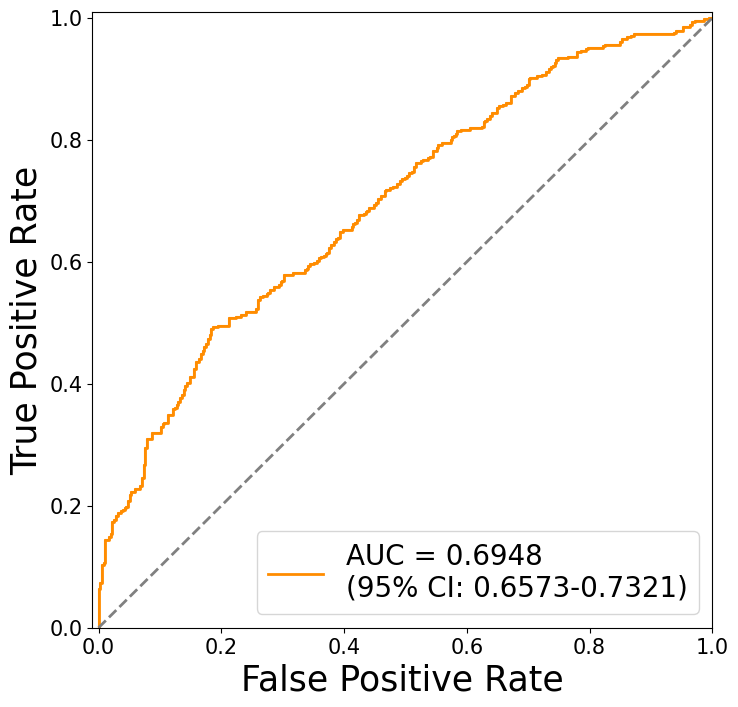

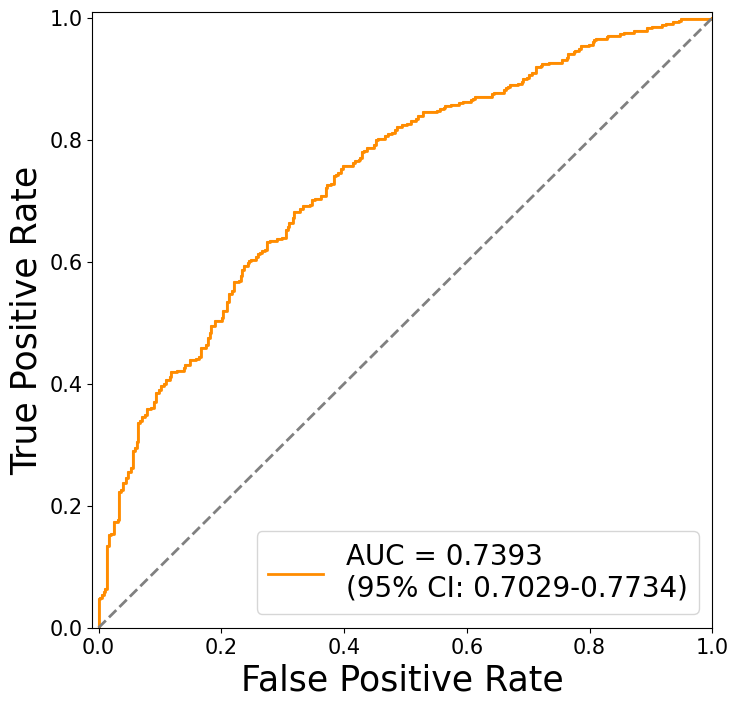

{3: {'vgg16': {'finetuning': 0.46339872}, 'resnet50': {'finetuning': 0.63582844}, 'vgg19': {'finetuning': 0.4653716}, 'resnet152': {'finetuning': 0.4965468}, 'Ensemble': {'finetuning': 0.51167667}}, 4: {'vgg16': {'finetuning': 0.50727004}, 'resnet50': {'finetuning': 0.56782985}, 'vgg19': {'finetuning': 0.5614006}, 'resnet152': {'finetuning': 0.21475309}, 'Ensemble': {'finetuning': 0.52379656}}, 6: {'vgg16': {'finetuning': 0.4089628}, 'resnet50': {'finetuning': 0.45267934}, 'vgg19': {'finetuning': 0.5925071}, 'resnet152': {'finetuning': 0.5812194}, 'Ensemble': {'finetuning': 0.43651974}}}


In [8]:
def get_filtered_result(proba, label, age):
    temp_proba, temp_label,temp_age = [], [], []
    for i in range(len(age)):
        targeted = False
        if group == 'AGE1'   and (age[i] <= 50): targeted = True
        if group == 'AGE2'   and (age[i] > 50): targeted = True
        if targeted == True:
            temp_proba.append(proba[i])
            temp_label.append(label[i])
            temp_age.append(age[i])
    proba = np.array(temp_proba)
    label = np.array(temp_label)
    age = np.array(temp_age)
    return proba, label, age

val_threshold = {}
for crop in crops:
    val_threshold[crop] = {}
    for model_name in ['vgg16','resnet50', 'vgg19', 'resnet152','Ensemble']:
        val_threshold[crop][model_name] = {}
        for train_strategy in train_strategies:
            label =  output[crop][model_name][train_strategy]['val']['label']
            proba =  output[crop][model_name][train_strategy]['val']['proba']

            # Get Threshold...
            auroc, threshold, accuracy = plot_roc_curve(label, proba, '', size=(8,8), save = False, save_path = '')
            val_threshold[crop][model_name][train_strategy] = threshold
    
print(val_threshold)

In [9]:
from pathlib import Path

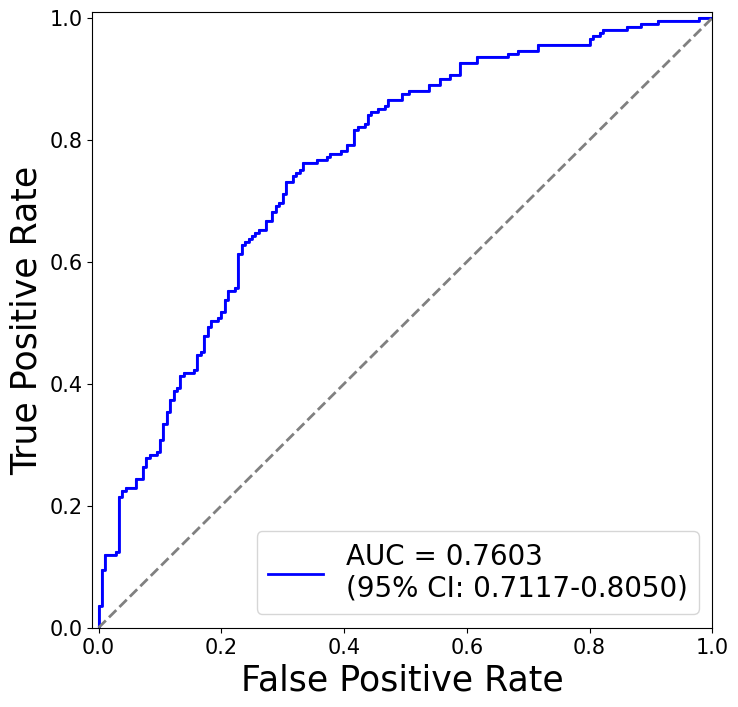

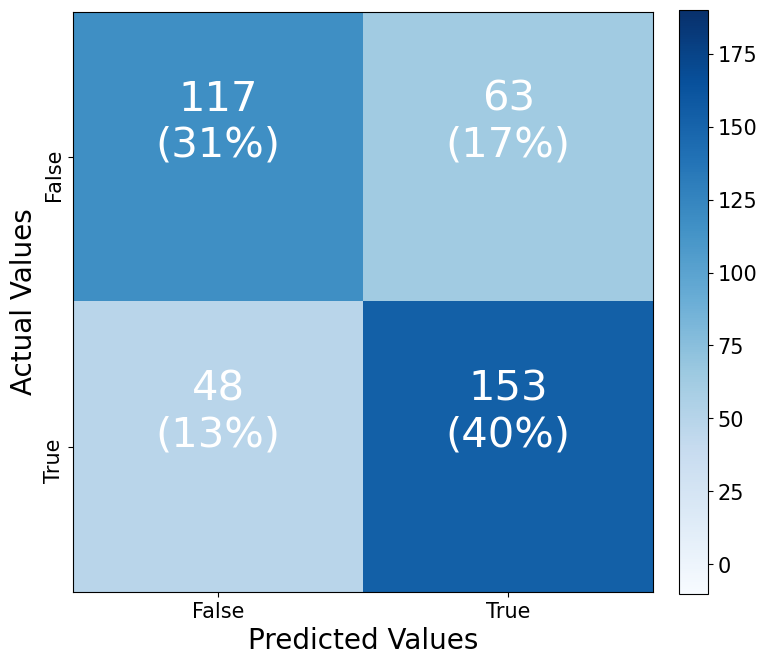

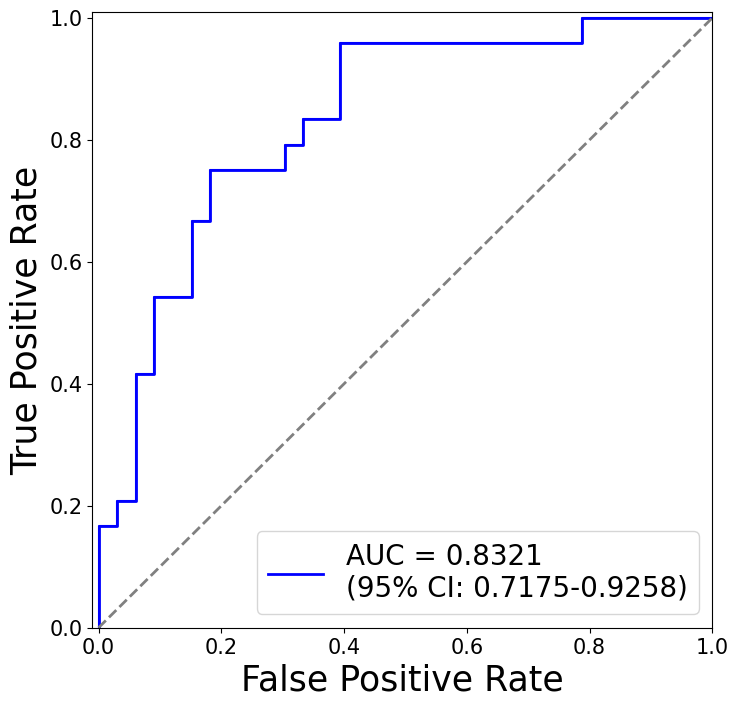

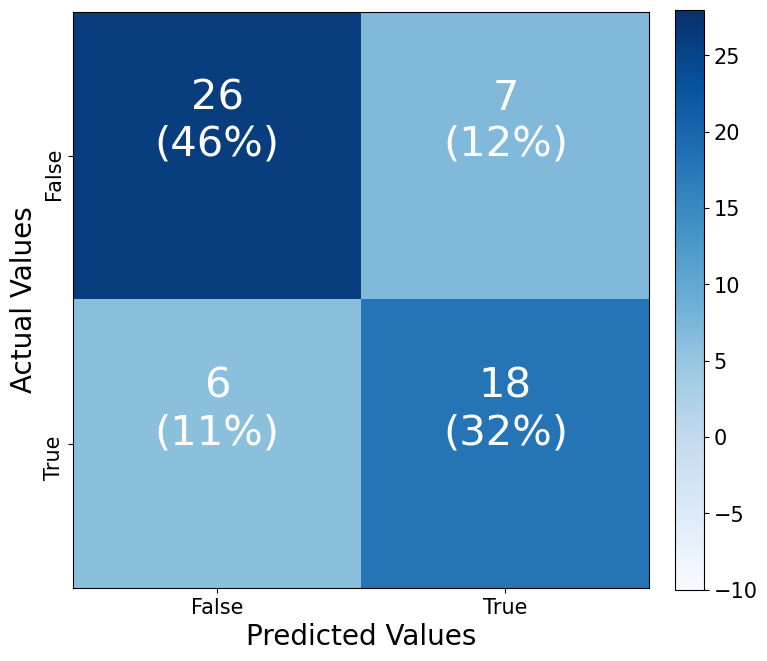

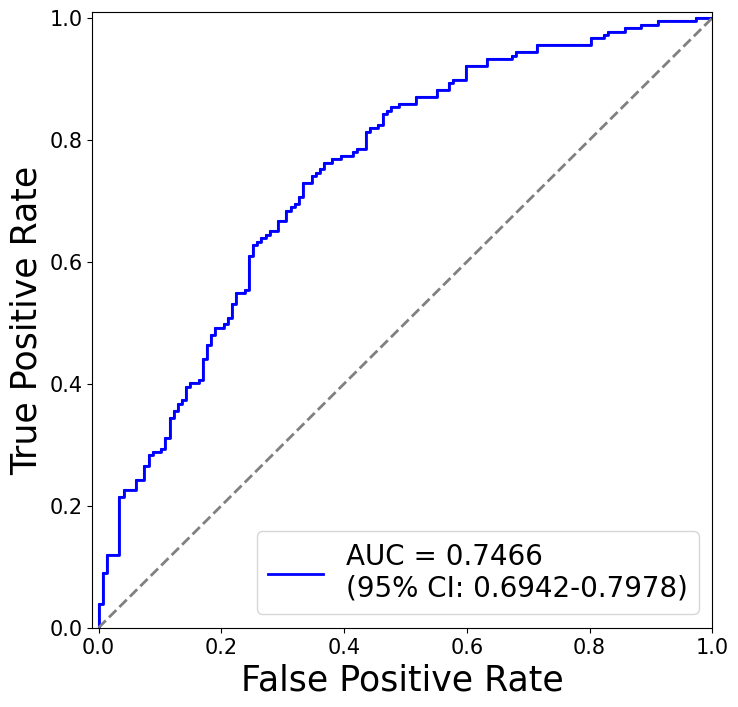

...

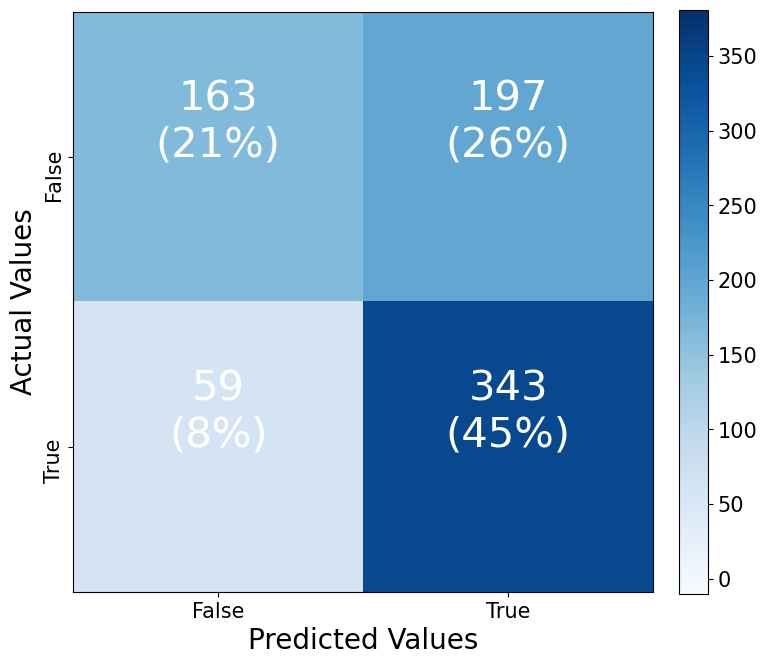

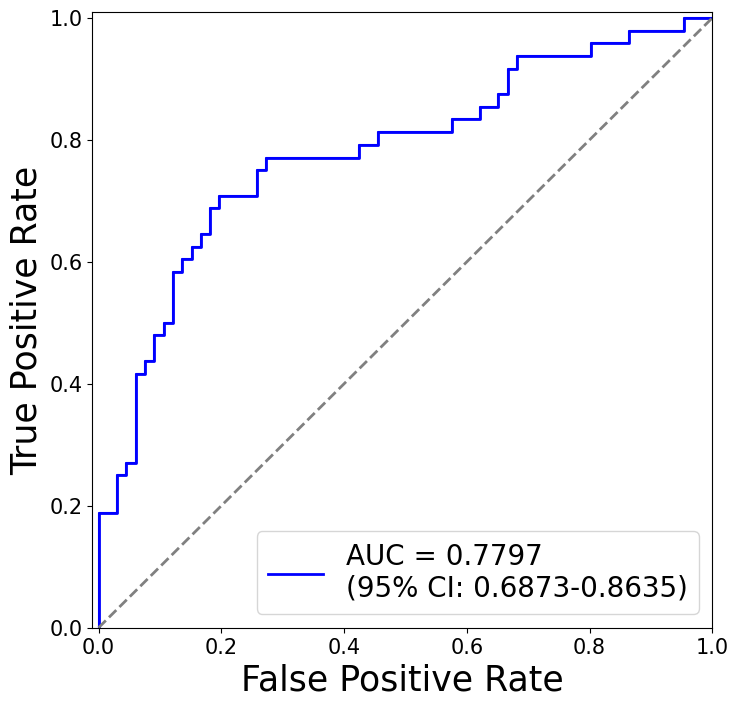

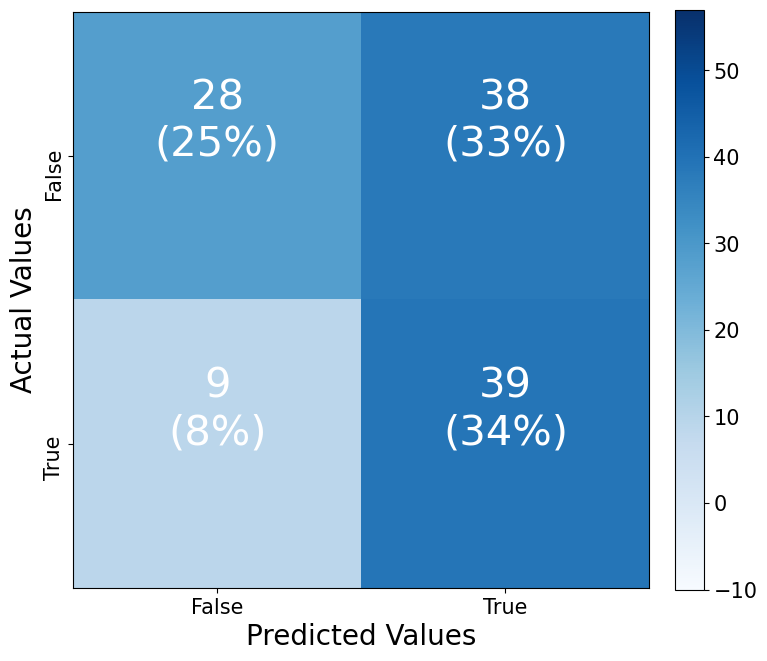

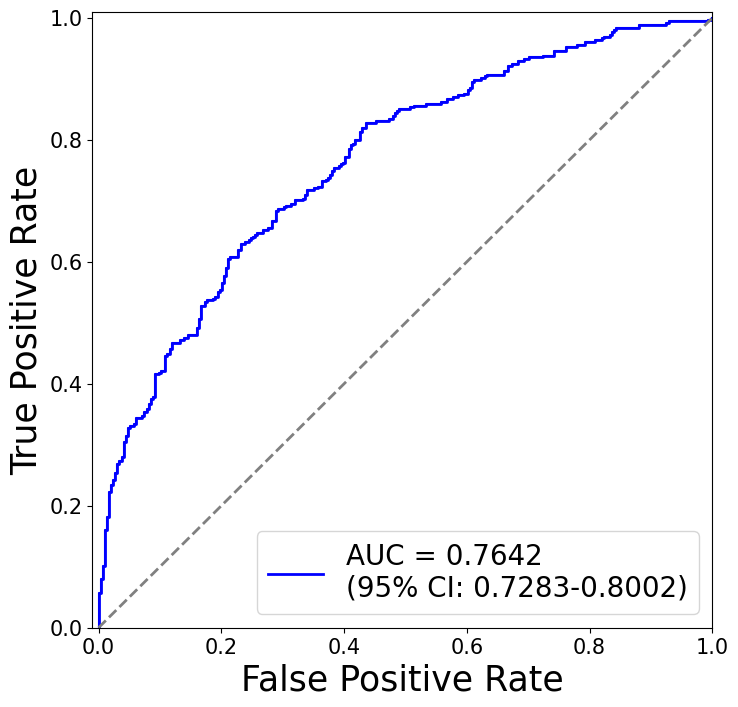

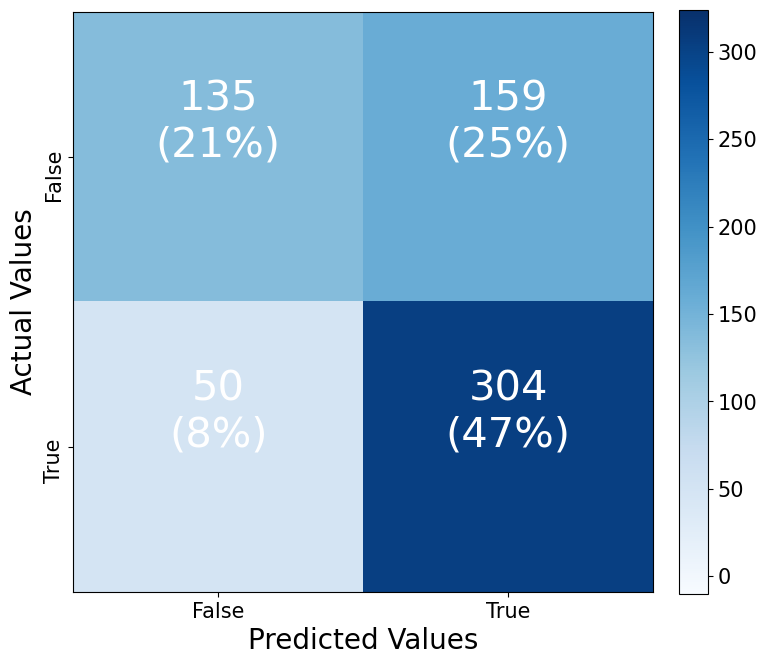

In [10]:
import matplotlib.pyplot as plt

# Main script with added table plotting functionality
ACCs = {}
for crop in crops:
    ACCs[crop] = {}
    for model_name in ['vgg16', 'resnet50', 'vgg19', 'resnet152', 'Ensemble']:
        ACCs[crop][model_name] = {}
        for train_strategy in train_strategies:
            ACCs[crop][model_name][train_strategy] = {}

            groups = ['ALL', 'AGE1', 'AGE2']

            # Color settings based on train strategy
            auroc_color, confusion_color = {'finetuning': ('Blue', plt.cm.Blues), 'fromscratch': ('Green', plt.cm.Greens), 'freeze': ('Orange', plt.cm.Oranges)}[train_strategy]
            save = False

            # Directory for saving figures
            figure_save_root = Path(f'''./Figures/Voting{crop}/{model_name}/{train_strategy}/''')
            figure_save_root.mkdir(parents=True, exist_ok=True)

            for group in groups:
                ACCs[crop][model_name][train_strategy][group] = {}
                
                # Paths for saving AUROC, confusion matrix, and metrics table figures
                auroc_save_path = f'./Figures/Voting{crop}/{model_name}/{train_strategy}/AUROC_{group}.png'
                confusion_save_path = f'./Figures/Voting{crop}/{model_name}/{train_strategy}/CONFUSION_{group}.png'
                metrics_save_path = f'./Figures/Voting{crop}/{model_name}/{train_strategy}/METRICS_{group}.png'

                # Get probabilities, labels, and ages
                proba = output[crop][model_name][train_strategy]['test']['proba']
                label = output[crop][model_name][train_strategy]['test']['label']
                age = output[crop][model_name][train_strategy]['test']['age']
                
                if group != 'ALL':
                    proba, label, age = get_filtered_result(proba, label, age)

                # Store probabilities, labels, and age data
                ACCs[crop][model_name][train_strategy][group].update({'proba': proba, 'label': label, 'age': age, 'n_pt': len(proba)})

                # Plot AUROC
                auroc, threshold, accuracy = plot_roc_curve(label, proba, '', size=(8, 8), color=auroc_color, save=save, save_path=auroc_save_path)
                
                # Make predictions based on threshold
                pred = decision_func(proba, threshold=val_threshold[crop][model_name][train_strategy])
                
                # Confusion matrix
                conf_mat = confusion_matrix(label, pred)
                padd_plot_confusion_matrix(figsize=(8, 8), xlabel='Predicted Values', ylabel='Actual Values', conf_matrix=conf_mat, x_labels=['False', 'True'], y_labels=['False', 'True'], color=confusion_color, save=save, save_path=confusion_save_path)

## Pre-processing patch results to slide results

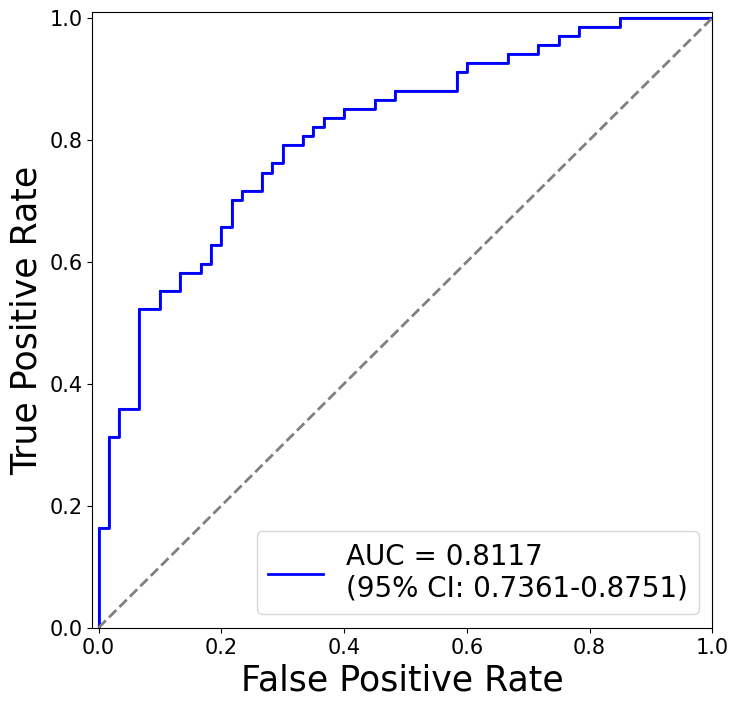

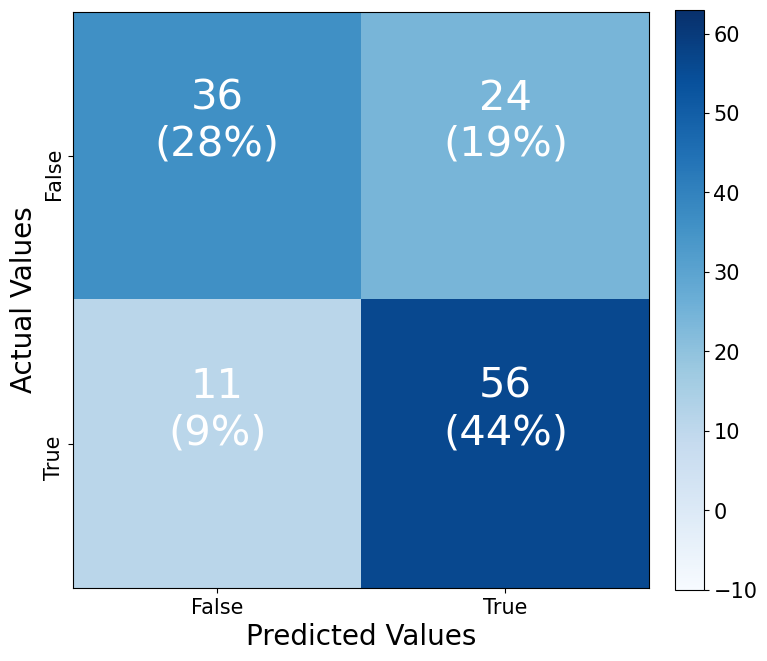

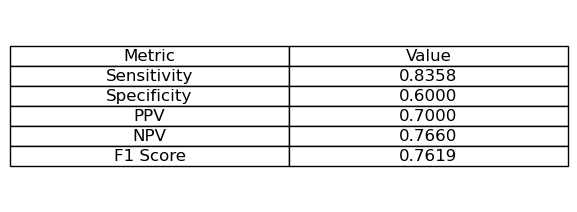

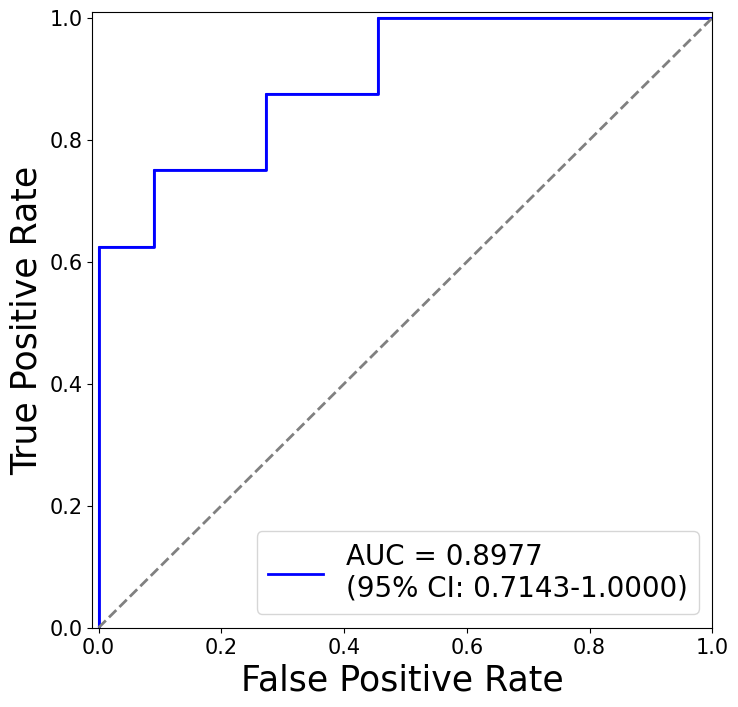

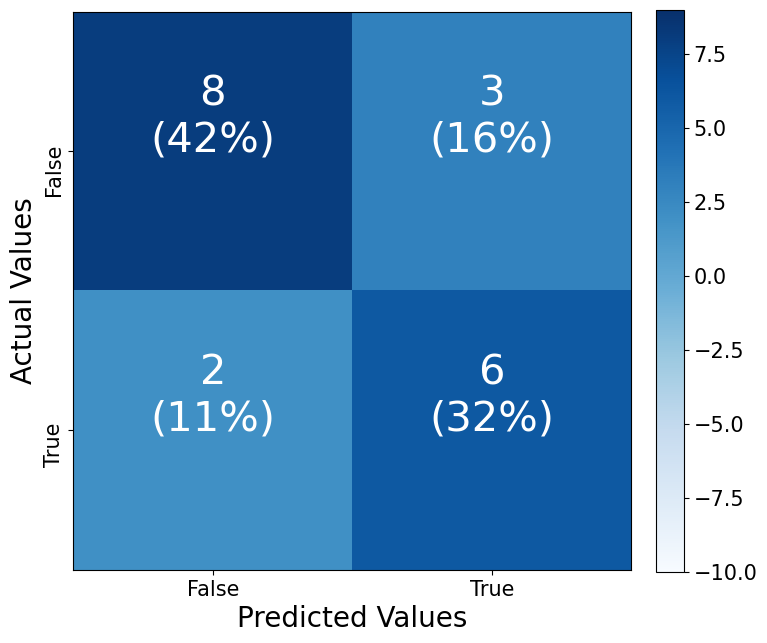

...

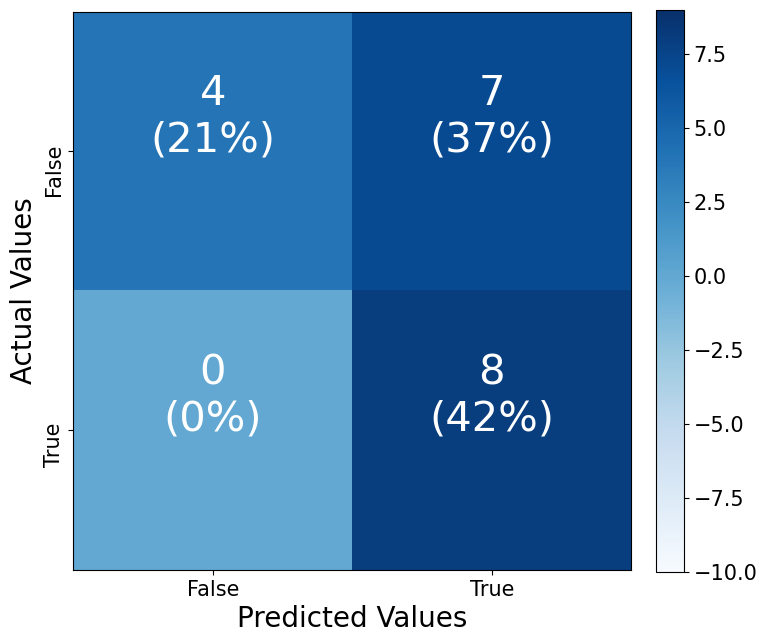

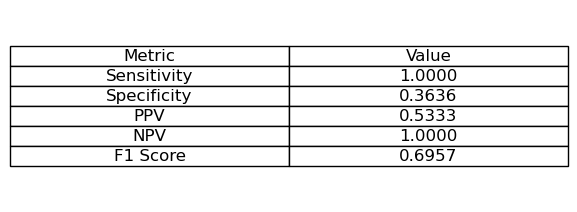

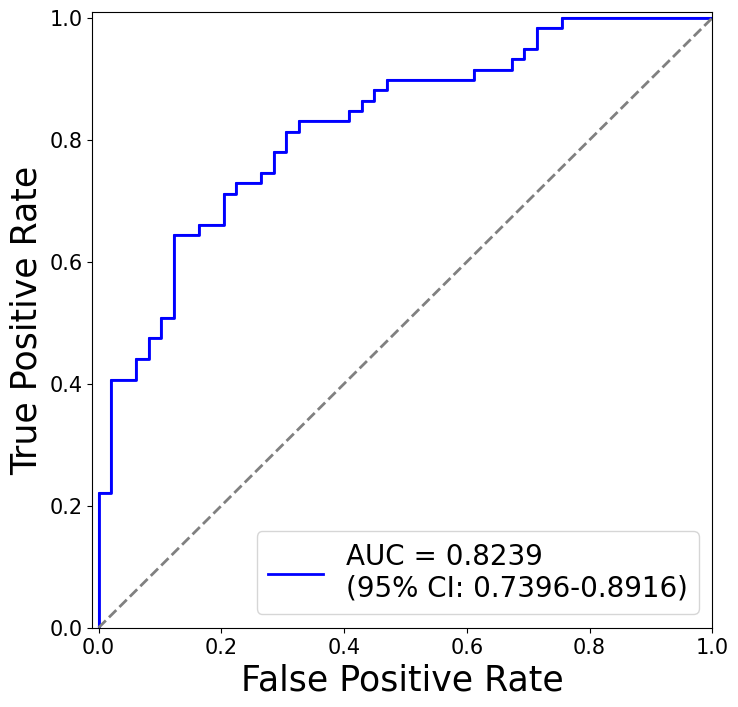

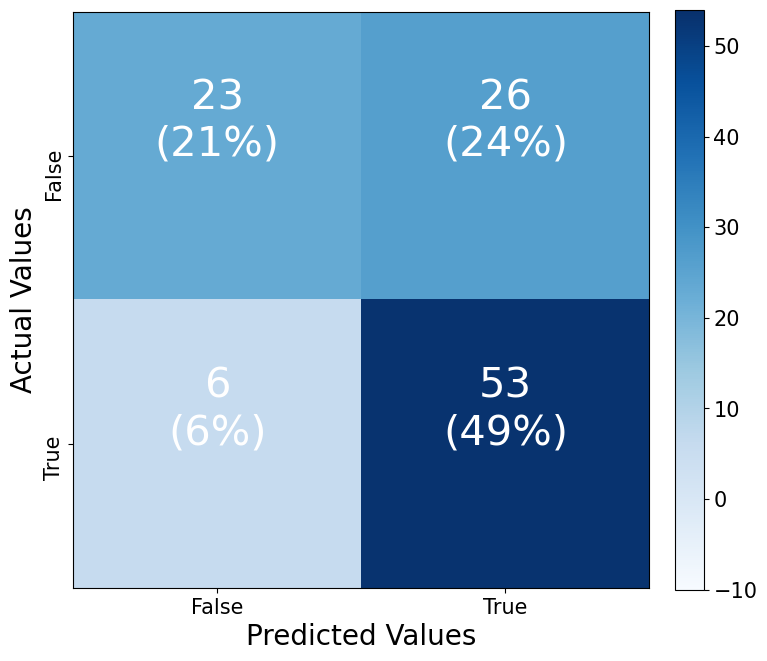

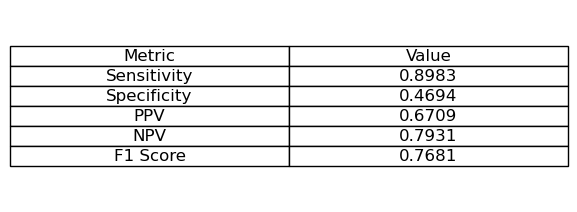

In [12]:
# Calculate additional metrics
def calculate_metrics(conf_matrix):
    TN, FP, FN, TP = conf_matrix.ravel()
    sensitivity = TP / (TP + FN) if (TP + FN) > 0 else 0
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
    PPV = TP / (TP + FP) if (TP + FP) > 0 else 0
    NPV = TN / (TN + FN) if (TN + FN) > 0 else 0
    F1 = 2 * (PPV * sensitivity) / (PPV + sensitivity) if (PPV + sensitivity) > 0 else 0
    return sensitivity, specificity, PPV, NPV, F1

# Create table plot for metrics
def plot_metrics_table(metrics, group, save_path=None):
    fig, ax = plt.subplots(figsize=(6, 2.5))  # Adjust height for additional row
    ax.axis('off')  # Turn off the axis

    # Table content
    table_data = [
        ["Metric", "Value"],
        ["Sensitivity", f"{metrics['sensitivity']:.4f}"],
        ["Specificity", f"{metrics['specificity']:.4f}"],
        ["PPV", f"{metrics['PPV']:.4f}"],
        ["NPV", f"{metrics['NPV']:.4f}"],
        ["F1 Score", f"{metrics['F1']:.4f}"]
    ]

    # Add table to the plot
    table = ax.table(cellText=table_data, colLabels=None, cellLoc='center', loc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(12)
    table.scale(1.2, 1.2)  # Adjust the scale as needed

    # Save or show the table
    if save_path:
        plt.savefig(save_path, bbox_inches="tight")
    plt.show()

slide_ACCs = {}
# Main script
for crop in crops:
    slide_ACCs[crop] = {}
    for model_name in ['vgg16', 'resnet50', 'vgg19', 'resnet152', 'Ensemble']:
        slide_ACCs[crop][model_name] = {}
        for train_strategy in ['finetuning']:
            slide_ACCs[crop][model_name][train_strategy] = {}

            groups = ['ALL', 'AGE1', 'AGE2']

            if train_strategy == 'finetuning':  
                auroc_color, confusion_color = 'Blue', plt.cm.Blues
            
            save = True

            figure_save_root = Path(f'''./Figures/Voting{crop}/{model_name}/{train_strategy}/''')
            figure_save_root.mkdir(parents=True, exist_ok=True)

            for group in groups:
                slide_ACCs[crop][model_name][train_strategy][group] = {}

                for slide_strategy in ['proba_mean']:
                    slide_ACCs[crop][model_name][train_strategy][group][slide_strategy] = {}

                    auroc_save_path = f'''./Figures/Voting{crop}/{model_name}/{train_strategy}/AUROC_{group}.png'''
                    confusion_save_path = f'''./Figures/Voting{crop}/{model_name}/{train_strategy}/CONFUSION_{group}.png'''
                    metrics_save_path = f'''./Figures/Voting{crop}/{model_name}/{train_strategy}/METRICS_{group}.png'''

                    proba = ACCs[crop][model_name][train_strategy][group]['proba'].reshape(-1, crop).mean(axis=-1)

                    pred = decision_func(proba, threshold=val_threshold[crop][model_name][train_strategy])
                    label = ACCs[crop][model_name][train_strategy][group]['label'].reshape(-1, crop).mean(axis=-1)
                    age = ACCs[crop][model_name][train_strategy][group]['age'].reshape(-1, crop).mean(axis=-1)

                    slide_ACCs[crop][model_name][train_strategy][group][slide_strategy]['proba'] = proba
                    slide_ACCs[crop][model_name][train_strategy][group][slide_strategy]['age'] = age
                    slide_ACCs[crop][model_name][train_strategy][group][slide_strategy]['label'] = label
                    slide_ACCs[crop][model_name][train_strategy][group][slide_strategy]['n_pt'] = len(proba)
                    slide_ACCs[crop][model_name][train_strategy][group][slide_strategy]['pred'] = pred           

                    auroc, threshold, accuracy = plot_roc_curve(label, proba, '', size=(8, 8), color=auroc_color, save=save, save_path=auroc_save_path)
                    
                    conf_mat = confusion_matrix(label, pred)
                    padd_plot_confusion_matrix(figsize=(8, 8), xlabel='Predicted Values', ylabel='Actual Values',
                                               conf_matrix=conf_mat, x_labels=['False', 'True'], y_labels=['False', 'True'], 
                                               color=confusion_color, save=save, save_path=confusion_save_path)

                    # Calculate metrics
                    sensitivity, specificity, PPV, NPV, F1 = calculate_metrics(conf_mat)
                    slide_ACCs[crop][model_name][train_strategy][group][slide_strategy].update({
                        'sensitivity': sensitivity, 
                        'specificity': specificity,
                        'PPV': PPV,
                        'NPV': NPV,
                        'F1': F1
                    })

                    # Plot and save metrics table
                    plot_metrics_table({'sensitivity': sensitivity, 'specificity': specificity, 
                                        'PPV': PPV, 'NPV': NPV, 'F1': F1}, 
                                       group, save_path=metrics_save_path)


In [12]:
import pandas as pd
from pathlib import Path

# Initialize an empty dictionary to store all tables
all_tables = {}

# Define the models, strategies, and groups you are interested in
models = ['vgg16', 'resnet50', 'vgg19', 'resnet152', 'Ensemble']
train_strategies = ['finetuning']
groups = ['ALL', 'AGE1', 'AGE2']

# Create an Excel writer to save all dataframes into one file
with pd.ExcelWriter('Slide_AUROC_proba_mean_tables.xlsx', engine='xlsxwriter') as writer:

    # Loop through each training strategy
    for train_strategy in train_strategies:
        # Initialize a dictionary to store the data for this strategy
        table_data = {}
        
        # Loop through models and groups to populate the table for this strategy
        for model_name in models:
            table_data[model_name] = {}
            
            for group in groups:
                # Extract AUROC and n_pt from slide_ACCs dictionary for 'proba_mean' only
                try:
                    auroc = slide_ACCs[model_name][train_strategy][group]['proba_mean']['auroc']
                    n_pt = slide_ACCs[model_name][train_strategy][group]['proba_mean']['n_pt']
                except KeyError:
                    # If there's no data for this model/strategy/group combination, skip
                    auroc = None
                    n_pt = 0
                
                # Format the group as {group}_n={n_pt}
                group_label = f"{group}_n={n_pt}"
                
                # Store the AUROC value in the corresponding position
                table_data[model_name][group_label] = auroc
        
        # Convert the dictionary into a DataFrame
        df = pd.DataFrame(table_data)
        
        # Store the dataframe in the all_tables dictionary with the strategy name
        all_tables[train_strategy] = df
        
        # Save each dataframe into a separate sheet of the Excel file
        df.to_excel(writer, sheet_name=train_strategy)

    print("AUROC tables saved to 'Slide_AUROC_proba_mean_tables.xlsx'.")


AUROC tables saved to 'Slide_AUROC_proba_mean_tables.xlsx'.


In [18]:
import pandas as pd
import numpy as np
from scipy import stats

# Function to calculate p-value using DeLong's test between two AUROC values
def calc_pvalue(auroc1, n1, auroc2, n2):
    auc_diff = abs(auroc1 - auroc2)
    se = np.sqrt((auroc1 * (1 - auroc1) / n1) + (auroc2 * (1 - auroc2) / n2))
    z_score = auc_diff / se
    p_value = 2 * (1 - stats.norm.cdf(abs(z_score)))
    return p_value

# Example dataframes (replace with your actual DataFrame variables)
df_3split = pd.DataFrame({
    'Unnamed: 0': ['ALL_n=127'],
    'vgg16': [0.820647],
    'resnet50': [0.743284],
    'vgg19': [0.826617],
    'resnet152': [0.7699]
})

df_4split = pd.DataFrame({
    'Unnamed: 0': ['ALL_n=127'],
    'vgg16': [0.862935],
    'resnet50': [0.733085],
    'vgg19': [0.847015],
    'resnet152': [0.800746]
})

df_6split = pd.DataFrame({
    'Unnamed: 0': ['ALL_n=127'],
    'vgg16': [0.831095],
    'resnet50': [0.702985],
    'vgg19': [0.8199],
    'resnet152': [0.762935]
})

# List of the three dataframes
dfs = [df_3split, df_4split, df_6split]

# Number of samples (use 127, as extracted from 'ALL_n=127')
n_samples = 127

# AUROC values across the splits for each model
models = ['vgg16', 'resnet50', 'vgg19', 'resnet152']
split_names = ['3-split', '4-split', '6-split']

# Initialize an empty matrix for storing p-values
p_value_matrix = pd.DataFrame(np.zeros((len(split_names), len(split_names))), 
                              index=split_names, columns=split_names)

# Calculate the DeLong's test p-value for each pair of dataframes
for i in range(len(dfs)):
    for j in range(i, len(dfs)):  # Only need to calculate for upper triangle
        if i == j:
            p_value_matrix.iloc[i, j] = np.nan  # Diagonal should be NaN
        else:
            p_values = []
            for model in models:
                auroc1 = dfs[i][model].values[0]
                auroc2 = dfs[j][model].values[0]
                # Calculate the p-value for the current model between two splits
                p_val = calc_pvalue(auroc1, n_samples, auroc2, n_samples)
                p_values.append(p_val)
            
            # Store the mean p-value (or you can decide on a different strategy, like the max p-value)
            avg_p_value = np.mean(p_values)
            p_value_matrix.iloc[i, j] = avg_p_value
            p_value_matrix.iloc[j, i] = avg_p_value  # Mirror the value for symmetry

# Output the p-value matrix
print(p_value_matrix)

# Optionally save to an Excel file
p_value_matrix.to_excel('Voting_delong_p_value_matrix.xlsx')


          3-split   4-split   6-split
3-split       NaN  0.604339  0.770685
4-split  0.604339       NaN  0.525285
6-split  0.770685  0.525285       NaN


In [41]:
import pandas as pd
import numpy as np
from scipy import stats

# Function to calculate p-value using DeLong's test between two AUROC values
def calc_pvalue(auroc1, n1, auroc2, n2):
    auc_diff = abs(auroc1 - auroc2)
    se = np.sqrt((auroc1 * (1 - auroc1) / n1) + (auroc2 * (1 - auroc2) / n2))
    z_score = auc_diff / se
    p_value = 2 * (1 - stats.norm.cdf(abs(z_score)))
    return p_value

# Sample dataframes (replace with your actual DataFrame variables)
df = pd.DataFrame({
    'model': ['Whole image VGG16', 'VGG16_3', 'VGG16_4', 'VGG16_6'],
    'auroc': [0.8426, 0.8117, 0.8726, 0.7958]
})

# Number of samples
n_samples = 128

# Initialize an empty matrix for storing p-values
p_value_matrix = pd.DataFrame(np.zeros((len(df), len(df))), 
                              index=df['model'], columns=df['model'])

# Calculate the DeLong's test p-value for each pair of models
for i in range(len(df)):
    for j in range(i, len(df)):  # Only need to calculate for upper triangle
        if i == j:
            p_value_matrix.iloc[i, j] = np.nan  # Diagonal should be NaN
        else:
            # Get AUROC values for both models
            auroc1 = df.iloc[i]['auroc']
            auroc2 = df.iloc[j]['auroc']
            # Calculate the p-value for the current model pair
            p_val = calc_pvalue(auroc1, n_samples, auroc2, n_samples)
            p_value_matrix.iloc[i, j] = p_val
            p_value_matrix.iloc[j, i] = p_val  # Mirror the value for symmetry

# Output the p-value matrix
print(p_value_matrix)

# Optionally save to an Excel file
p_value_matrix.to_excel('Direct_delong_p_value_matrix.xlsx')


model              Whole image VGG16   VGG16_3   VGG16_4   VGG16_6
model                                                             
Whole image VGG16                NaN  0.512911  0.491826  0.329737
VGG16_3                     0.512911       NaN  0.179939  0.748712
VGG16_4                     0.491826  0.179939       NaN  0.096727
VGG16_6                     0.329737  0.748712  0.096727       NaN
